# Assignment 1: Opinion Network Creation & Analysis

2 fundamentally different ways are used to turn the survey data into a network:
- **Students as nodes:** An edge means two students answered
  similarly. 
- **Questions as nodes:** An edge means two survey items are answered
  similarly across the whole cohort. 

## Students as nodes

Represent every student as a node. Each student has:
- a **global** response vector (all 60 items)
- four **topic** response vectors (15 items each: T, E, S, V)

For each of these five vector spaces we build a student-similarity graph, run community detection on it, and analyze whether single-topic student clusters line up with those in the global graph.

We compute similarity in **four ways**:
- Pearson correlation
- Cosine similarity
- Exact agreement rate
- Euclidean distance

The resulting graphs are too dense and need to be sparsified for further analysis. The following methods were used for the same (aside from the **full** weighted graph):
- **k-NN**
- Density **threshold**
- **Percolation-theoretic threshold**

In [40]:

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

pd.set_option('display.width', 140)
np.random.seed(42)



## 1. Load and clean the data

In [41]:

LIKERT_MAP = {
    'Strongly Disagree': 1, 'Disagree': 2, 'Neutral': 3, 'Agree': 4, 'Strongly Agree': 5,
}

def load_data(path):
    df = pd.read_csv(path, skipinitialspace=True, encoding='utf-8-sig')
    cols = ['id'] + [c.split('.')[0].strip() for c in df.columns[1:]]
    df.columns = cols
    resp = df.iloc[:, 1:].apply(lambda s: s.str.strip())
    coded = resp.replace(LIKERT_MAP)
    coded = coded.where(coded.isin([1, 2, 3, 4, 5]), np.nan)  # 'No Comments' / blank -> NaN
    coded = coded.apply(pd.to_numeric, errors='coerce')
    return pd.concat([df['id'], coded], axis=1)

data = load_data('Survey_Results_UC.csv')
print('students x columns:', data.shape)
data.head()


students x columns: (96, 61)


,id,T01,T02,T03,T04,T05,T06,T07,T08,T09,...,V06,V07,V08,V09,V10,V11,V12,V13,V14,V15
0,11,4.0,4.0,3.0,5.0,5.0,4.0,4.0,2.0,3.0,...,3.0,4.0,3.0,5.0,3.0,3.0,3.0,4.0,4.0,3.0
1,12,4.0,4.0,5.0,4.0,3.0,4.0,4.0,2.0,3.0,...,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0
2,13,4.0,5.0,3.0,2.0,5.0,4.0,5.0,4.0,3.0,...,4.0,5.0,5.0,5.0,5.0,5.0,4.0,5.0,5.0,4.0
3,14,3.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,2.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,5.0,5.0,4.0
4,16,3.0,4.0,5.0,5.0,1.0,5.0,5.0,4.0,3.0,...,4.0,5.0,4.0,5.0,3.0,4.0,3.0,5.0,5.0,4.0



## 2. Topic groups and the completeness problem

Some students skipped entire topic blocks or the whole survey. Those rows carry
no signal for the blocks they skipped, so we restrict to the **68 students with
zero missing answers anywhere**.

In [42]:

TOPIC_COLS = {t: [c for c in data.columns if c.startswith(t)] for t in ['T', 'E', 'S', 'V']}
GLOBAL_COLS = TOPIC_COLS['T'] + TOPIC_COLS['E'] + TOPIC_COLS['S'] + TOPIC_COLS['V']

for t, cols in TOPIC_COLS.items():
    n_complete = data[cols].notna().all(axis=1).sum()
    print(f'topic {t}: {len(cols)} items, {n_complete}/{len(data)} students answered all of them')

complete_mask = data[GLOBAL_COLS].notna().all(axis=1)
print(f'\ncommon cohort (complete on all 60 items): {complete_mask.sum()}/{len(data)} students')
print('excluded student ids:', data.loc[~complete_mask, 'id'].tolist())

cohort = data.loc[complete_mask].reset_index(drop=True)
N = len(cohort)
SPACES = {'global': GLOBAL_COLS, **TOPIC_COLS}


topic T: 15 items, 83/96 students answered all of them
topic E: 15 items, 81/96 students answered all of them
topic S: 15 items, 78/96 students answered all of them
topic V: 15 items, 81/96 students answered all of them

common cohort (complete on all 60 items): 68/96 students
excluded student ids: [12, 19, 24, 30, 32, 39, 40, 42, 44, 60, 68, 69, 73, 77, 78, 79, 81, 84, 87, 92, 93, 95, 102, 103, 118, 120, 123, 125]


In [43]:

CAT = ['#2a78d6', '#eb6834', '#1baf7a', '#eda100', '#e87ba4', '#008300', '#4a3aa7', '#e34948']
TOPIC_COLOR = {'T': CAT[0], 'E': CAT[1], 'S': CAT[2], 'V': CAT[3]}
SURFACE, INK, INK2, MUTED, GRID = '#fcfcfb', '#0b0b0b', '#52514e', '#898781', '#e1e0d9'
plt.rcParams.update({
    'figure.facecolor': SURFACE, 'axes.facecolor': SURFACE,
    'axes.edgecolor': GRID, 'axes.labelcolor': INK2,
    'text.color': INK, 'xtick.color': INK2, 'ytick.color': INK2,
    'axes.grid': False, 'font.size': 10,
})
topics = ['T', 'E', 'S', 'V']



## 3. Four ways to measure "like-minded"

- **Pearson correlation**: direction of agreement between two students, which almost neglects the extreme-ness of their responses.
- **Cosine similarity**: angle between the raw 1–5 rating vectors.
- **Agreement rate**: fraction of items on which two students picked the exact same category. The most literal reading of "like-minded."
- **Euclidean distance, inverted**: inverse of the euclidean distance between the vectors corresponding to the responses of the students.

In [44]:

def pearson_sim(X):
    with np.errstate(invalid='ignore'):
        S = np.corrcoef(X)
    S = np.nan_to_num(S, nan=0.0)
    np.fill_diagonal(S, 1.0)
    return S

def cosine_sim(X):
    norms = np.linalg.norm(X, axis=1, keepdims=True)
    norms[norms == 0] = 1.0
    Xn = X / norms
    return Xn @ Xn.T

def agreement_sim(X):
    n = X.shape[0]
    S = np.zeros((n, n))
    for i in range(n):
        S[i] = (X == X[i]).mean(axis=1)
    return S

def euclidean_sim(X):
    diff = X[:, None, :] - X[None, :, :]
    D = np.sqrt((diff ** 2).sum(axis=2))
    return 1.0 / (1.0 + D)

METRICS = {'pearson': pearson_sim, 'cosine': cosine_sim, 'agreement': agreement_sim, 'euclidean': euclidean_sim}

sim_matrices = {}
for space_name, cols in SPACES.items():
    X = cohort[cols].values.astype(float)
    for metric_name, fn in METRICS.items():
        sim_matrices[(space_name, metric_name)] = fn(X)

print(f'{len(sim_matrices)} similarity matrices computed (5 spaces x 4 metrics), each {N}x{N}')


20 similarity matrices computed (5 spaces x 4 metrics), each 68x68



## 4. Building the graph, four ways

- **Full**: every pair of students with a positive similarity gets an edge, weighted by that similarity. 
- **k-NN (k=8)**: every student links to their 8 most similar peers (edges symmetrised).
- **Threshold (density-matched)**: keep the globally highest-similarity pairs only.
- **Percolation (theory-based threshold)**: add links from most to least similar, and stop when one big connected group first contains 80% of the students.

In [45]:

def full_graph(sim):
    n = sim.shape[0]
    G = nx.Graph()
    G.add_nodes_from(range(n))
    iu = np.triu_indices(n, k=1)
    for i, j in zip(*iu):
        w = sim[i, j]
        if w > 0:
            G.add_edge(int(i), int(j), weight=float(w))
    return G

def knn_graph(sim, k=8):
    n = sim.shape[0]
    G = nx.Graph()
    G.add_nodes_from(range(n))
    for i in range(n):
        row = sim[i].copy()
        row[i] = -np.inf
        for j in np.argsort(row)[-k:]:
            w = sim[i, j]
            if w > 0:
                if G.has_edge(i, j):
                    G[i][j]['weight'] = max(G[i][j]['weight'], w)
                else:
                    G.add_edge(i, j, weight=float(w))
    return G

def threshold_graph(sim, target_edges):
    n = sim.shape[0]
    iu = np.triu_indices(n, k=1)
    vals = sim[iu]
    order = np.argsort(vals)[::-1]
    G = nx.Graph()
    G.add_nodes_from(range(n))
    count = 0
    for idx in order:
        if count >= target_edges:
            break
        w = vals[idx]
        if w <= 0:
            break
        i, j = int(iu[0][idx]), int(iu[1][idx])
        G.add_edge(i, j, weight=float(w))
        count += 1
    return G

def percolation_graph(sim, target_gc=0.80):
    n = sim.shape[0]
    iu = np.triu_indices(n, k=1)
    vals = sim[iu]
    order = np.argsort(vals)[::-1]
    G = nx.Graph(); G.add_nodes_from(range(n))
    theta = vals[order[-1]]
    for idx in order:
        i, j = int(iu[0][idx]), int(iu[1][idx])
        G.add_edge(i, j)
        if len(max(nx.connected_components(G), key=len)) / n >= target_gc:
            theta = vals[idx]
            break
    Gp = nx.Graph(); Gp.add_nodes_from(range(n))
    mask = vals >= theta
    for i, j, keep in zip(iu[0], iu[1], mask):
        if keep:
            Gp.add_edge(int(i), int(j), weight=float(sim[i, j]))
    return Gp, theta

K = 8
graphs = {}
percolation_thetas = {}
for (space_name, metric_name), sim in sim_matrices.items():
    Gf = full_graph(sim)
    Gk = knn_graph(sim, k=K)
    Gt = threshold_graph(sim, target_edges=Gk.number_of_edges())
    Gp, theta = percolation_graph(sim, target_gc=0.80)
    graphs[(space_name, metric_name, 'full')] = Gf
    graphs[(space_name, metric_name, 'knn')] = Gk
    graphs[(space_name, metric_name, 'threshold')] = Gt
    graphs[(space_name, metric_name, 'percolation')] = Gp
    percolation_thetas[(space_name, metric_name)] = theta

print(f'{len(graphs)} graphs built (5 spaces x 4 metrics x 4 graph-building strategies)')


80 graphs built (5 spaces x 4 metrics x 4 graph-building strategies)


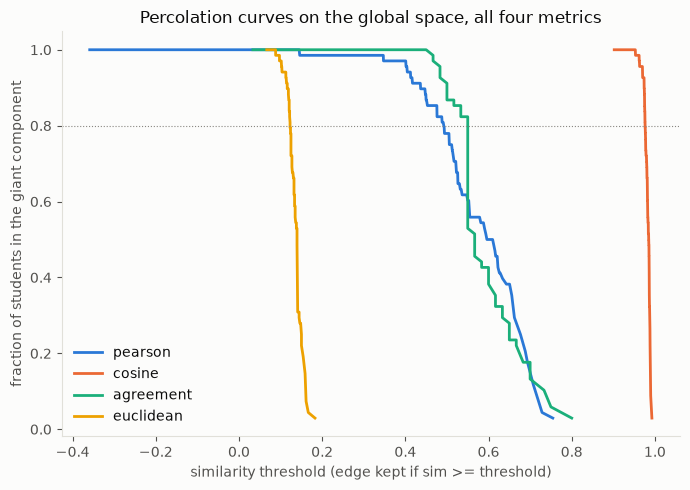

percolation thresholds (global space):
  pearson: theta=0.492, edges=303
  cosine: theta=0.977, edges=579
  agreement: theta=0.550, edges=275
  euclidean: theta=0.123, edges=324


In [46]:

def giant_component_curve(sim):
    n = sim.shape[0]
    iu = np.triu_indices(n, k=1)
    vals = sim[iu]
    order = np.argsort(vals)  # ascending: weakest first, so thresholds sweep high -> low
    thetas, gc_frac = [], []
    G = nx.Graph(); G.add_nodes_from(range(n))
    for rank, idx in enumerate(order[::-1]):  # add strongest edges first
        i, j = int(iu[0][idx]), int(iu[1][idx])
        G.add_edge(i, j)
        if rank % 4 == 0 or rank == len(order) - 1:
            thetas.append(vals[idx])
            gc_frac.append(len(max(nx.connected_components(G), key=len)) / n)
    return np.array(thetas), np.array(gc_frac)

fig, ax = plt.subplots(figsize=(7, 5))
for i, m in enumerate(METRICS):
    thetas, gc_frac = giant_component_curve(sim_matrices[('global', m)])
    ax.plot(thetas, gc_frac, color=CAT[i], linewidth=2, label=m)
ax.axhline(0.8, color=MUTED, linewidth=0.8, linestyle=':')
ax.set_xlabel('similarity threshold (edge kept if sim >= threshold)')
ax.set_ylabel('fraction of students in the giant component')
ax.set_title('Percolation curves on the global space, all four metrics')
ax.legend(frameon=False)
ax.spines[['top', 'right']].set_visible(False)
fig.tight_layout()
plt.show()

print('percolation thresholds (global space):')
for m in METRICS:
    print(f'  {m}: theta={percolation_thetas[("global", m)]:.3f}, '
          f'edges={graphs[("global", m, "percolation")].number_of_edges()}')



Every metric shows a real phase transition, at very different absolute threshold values since the four similarity notions live on different scales but have the same qualitative S-curve shape. 



## 5. Community detection (Louvain modularity maximisation)

Run Louvain on all 80 graphs (5 spaces × 4 metrics × 4 graph-building
strategies), `seed=42` for reproducibility.


In [47]:

partitions = {}
modularity = {}
summary_rows = []

for key, G in graphs.items():
    comms = nx.community.louvain_communities(G, weight='weight', seed=42)
    label = np.zeros(N, dtype=int)
    for cid, nodes in enumerate(comms):
        for node in nodes:
            label[node] = cid
    partitions[key] = label
    total_w = sum(w for _, _, w in G.edges(data='weight', default=0))
    modularity[key] = nx.community.modularity(G, comms, weight='weight') if total_w > 0 else float('nan')
    space, metric, gtype = key
    n_substantive = sum(1 for c in comms if len(c) >= 2)
    summary_rows.append({'space': space, 'metric': metric, 'graph': gtype, 'n_communities': len(comms),
                          'substantive_communities': n_substantive, 'modularity': round(modularity[key], 3)})

summary_df = pd.DataFrame(summary_rows)
summary_df.pivot_table(index=['metric', 'graph'], columns='space', values='n_communities')


space                     E     S     T     V  global
metric    graph                                      
agreement full          2.0   2.0   2.0   2.0     2.0
          knn           4.0   4.0   5.0   4.0     3.0
          percolation   6.0   8.0  16.0  10.0    16.0
          threshold     8.0  11.0   5.0  11.0    11.0
cosine    full          1.0   1.0   1.0   1.0     1.0
          knn           4.0   4.0   5.0   5.0     4.0
          percolation  18.0  16.0  17.0  17.0    18.0
          threshold    14.0  26.0  11.0  22.0    22.0
euclidean full          2.0   2.0   4.0   2.0     2.0
          knn           5.0   4.0   5.0   3.0     2.0
          percolation  12.0  14.0  15.0  15.0    15.0
          threshold    11.0  15.0  11.0  13.0     9.0
pearson   full          4.0  10.0   5.0  15.0     3.0
          knn           6.0  11.0   6.0  15.0     5.0
          percolation  15.0  18.0  16.0  20.0    17.0
          threshold    14.0  10.0   8.0  15.0    14.0


**Cosine collapses to a single community only on the `full` graph**: This is because all pairwise cosine similarities are positive and close together on a 1–5 scale, so weighted modularity finds no contrast to
split on. All three sparsified strategies restore enough contrast for cosine to produce real structure.



## 6. Does a topic's "like-minded" grouping survive into the global grouping?

For every (metric, graph-building) combination except `(cosine, full)`, compare each topic's partition to the global partition using Adjusted Rand Index (ARI): 0 = no better than chance, 1 = identical.


In [48]:

rows = []
for metric_name in METRICS:
    for graph_type in ['full', 'knn', 'threshold', 'percolation']:
        if metric_name == 'cosine' and graph_type == 'full':
            continue
        global_label = partitions[('global', metric_name, graph_type)]
        for topic in ['T', 'E', 'S', 'V']:
            topic_label = partitions[(topic, metric_name, graph_type)]
            rows.append({
                'metric': metric_name, 'graph': graph_type, 'topic': topic,
                'ARI': adjusted_rand_score(global_label, topic_label),
                'NMI': normalized_mutual_info_score(global_label, topic_label),
            })

comparison_df = pd.DataFrame(rows)
comparison_df.pivot_table(index=['metric', 'graph'], columns='topic', values='ARI').round(3)


topic                      E      S      T      V
metric    graph                                  
agreement full         0.210  0.625  0.091  0.775
          knn          0.135  0.460  0.138  0.384
          percolation  0.130  0.304  0.207  0.265
          threshold    0.187  0.350  0.175  0.248
cosine    knn          0.126  0.106  0.099  0.012
          percolation  0.086  0.066  0.100  0.047
          threshold    0.126  0.168  0.024  0.077
euclidean full         0.183  0.579  0.059  0.625
          knn          0.175  0.415  0.050  0.427
          percolation  0.086  0.303  0.087  0.319
          threshold    0.106  0.357  0.099  0.408
pearson   full         0.171 -0.002  0.115 -0.015
          knn          0.119  0.045  0.092 -0.006
          percolation  0.181  0.044  0.163  0.040
          threshold    0.234 -0.017  0.230 -0.010

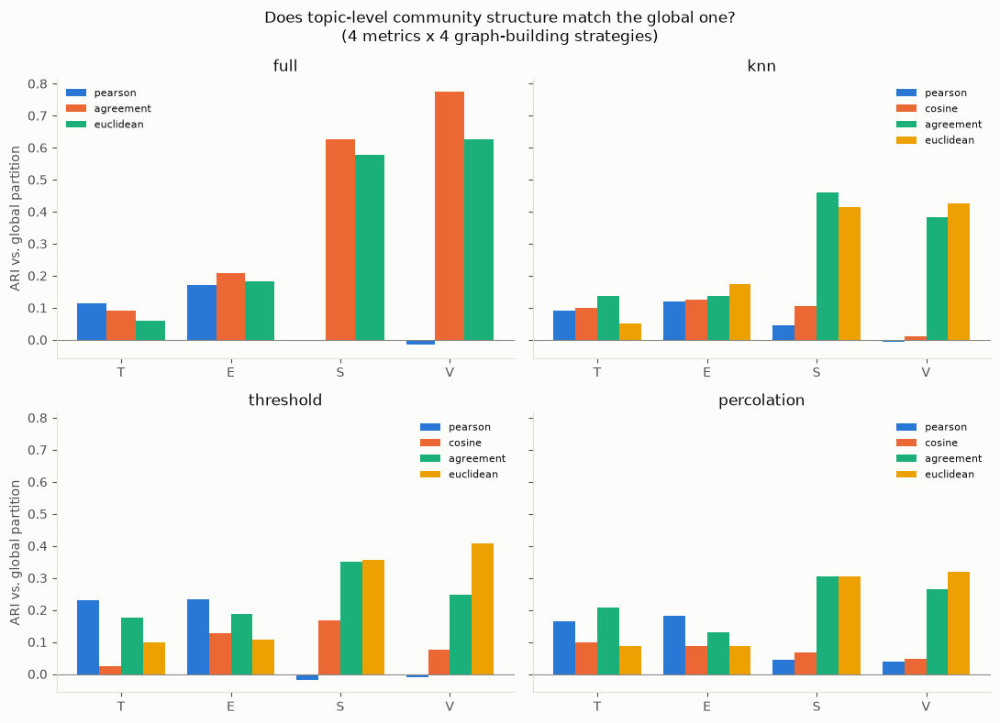

In [49]:

topics = ['T', 'E', 'S', 'V']
graph_types = ['full', 'knn', 'threshold', 'percolation']
fig, axes = plt.subplots(2, 2, figsize=(11, 8), sharey=True)
for ax, gtype in zip(axes.flat, graph_types):
    sub_metrics = [m for m in METRICS if not (m == 'cosine' and gtype == 'full')]
    x = np.arange(len(topics))
    width = 0.8 / len(sub_metrics)
    for i, m in enumerate(sub_metrics):
        sub = comparison_df[(comparison_df.metric == m) & (comparison_df.graph == gtype)].set_index('topic').loc[topics]
        ax.bar(x + (i - (len(sub_metrics) - 1) / 2) * width, sub['ARI'], width=width, label=m, color=CAT[i])
    ax.axhline(0, color=MUTED, linewidth=0.8)
    ax.set_xticks(x); ax.set_xticklabels(topics)
    ax.set_title(gtype)
    ax.legend(fontsize=8, frameon=False)
    ax.spines[['top', 'right']].set_visible(False)
for ax in axes[:, 0]:
    ax.set_ylabel('ARI vs. global partition')
fig.suptitle('Does topic-level community structure match the global one?\n(4 metrics x 4 graph-building strategies)')
fig.tight_layout()
plt.show()


**Society and Environment hold together better than Technology and Education**, however we build the graph. The student groups found in those two topics stay mostly the same when we change how the links are made, while the Technology and Education groups fall apart. Agreement-rate and Euclidean distance outperform other metrics, in terms of scaling to the global graph. Society & Ethics and Environment keep their communities in the global graph. Technology and Education mostly don't.


## 7. Which topics actually have opinions to cluster on?

A topic where 90% of students pick "Strongly Agree" has no real attitude
variation to build communities around. Item variance tells us which topics
are worth this kind of analysis at all.

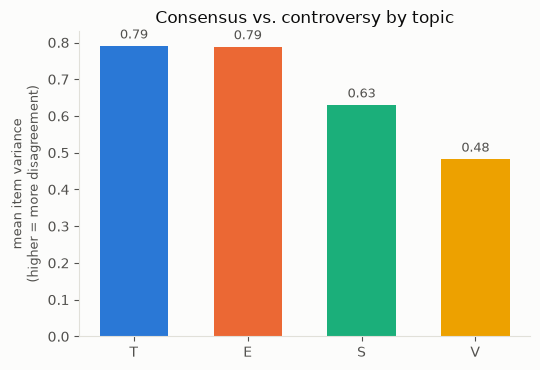

most controversial items (highest variance):
E04    1.382572
E09    1.201712
E02    1.197542
T08    1.161326
E03    1.084065
dtype: float64

most consensus items (lowest variance):
V13    0.246488
E15    0.257243
S09    0.281607
S05    0.306190
E10    0.321335
dtype: float64


In [50]:

item_var = cohort[GLOBAL_COLS].astype(float).var(axis=0)

fig, ax = plt.subplots(figsize=(5.5, 3.8))
vals = [item_var[TOPIC_COLS[t]].mean() for t in topics]
bars = ax.bar(topics, vals, color=[TOPIC_COLOR[t] for t in topics], width=0.6)
ax.set_ylabel('mean item variance\n(higher = more disagreement)', fontsize=9)
ax.set_title('Consensus vs. controversy by topic')
for b, v in zip(bars, vals):
    ax.text(b.get_x() + b.get_width() / 2, v + 0.02, f'{v:.2f}', ha='center', color=INK2, fontsize=9)
ax.spines[['top', 'right']].set_visible(False)
fig.tight_layout()
plt.show()

print('most controversial items (highest variance):')
print(item_var.sort_values(ascending=False).head(5))
print('\nmost consensus items (lowest variance):')
print(item_var.sort_values().head(5))


**T and E are where the real disagreement lives**; V (environment) and S are
close to unanimous. 

It's not that students are more "like-minded" about society/environment in some deep sense, it's that **there's less room to disagree there in the first place**, so whatever small variation exists lines up more closely with a person's *general* disposition (their global grouping). 


## 8. One graph per strategy

For each of the four graph-building strategies, draw the **global
agreement-rate graph once** and recolor its nodes five
times: by the global community assignment, then by each topic's own
community assignment.


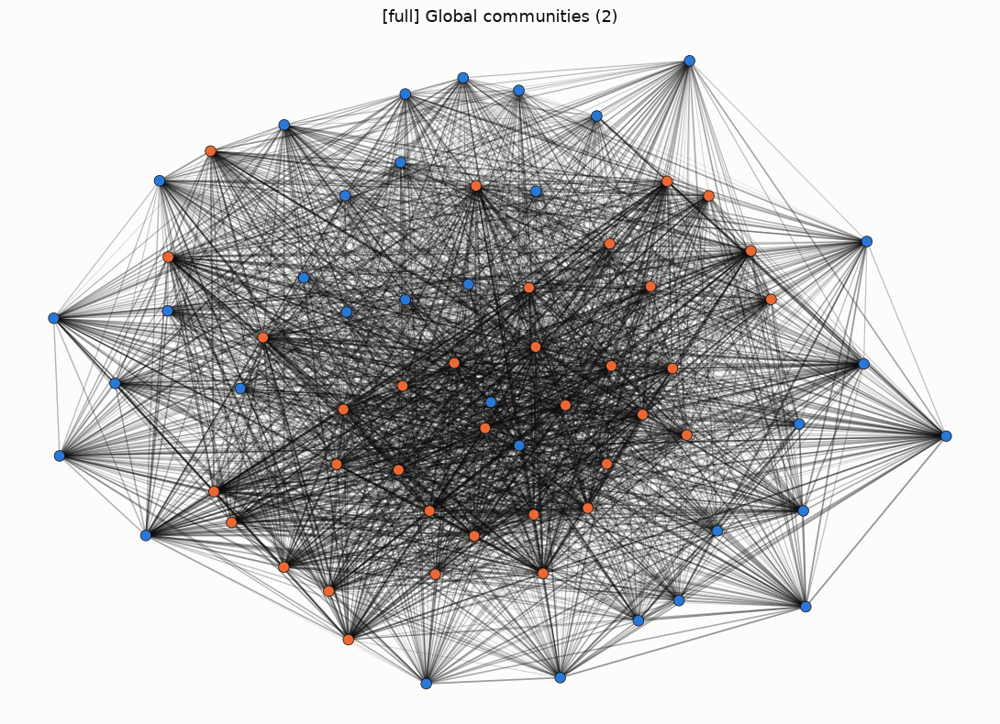

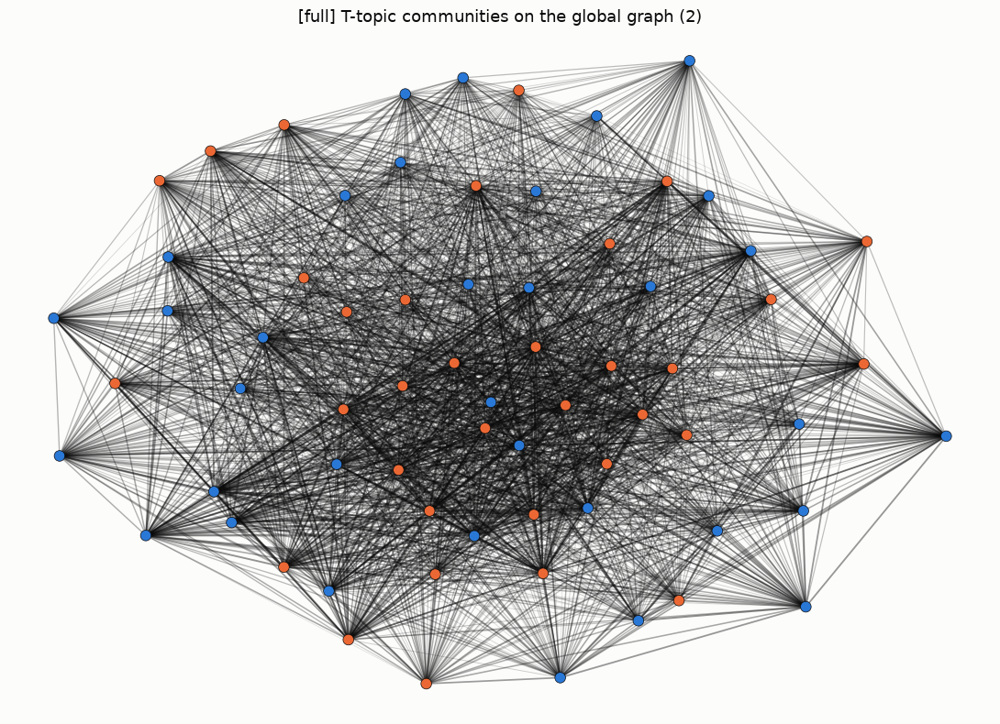

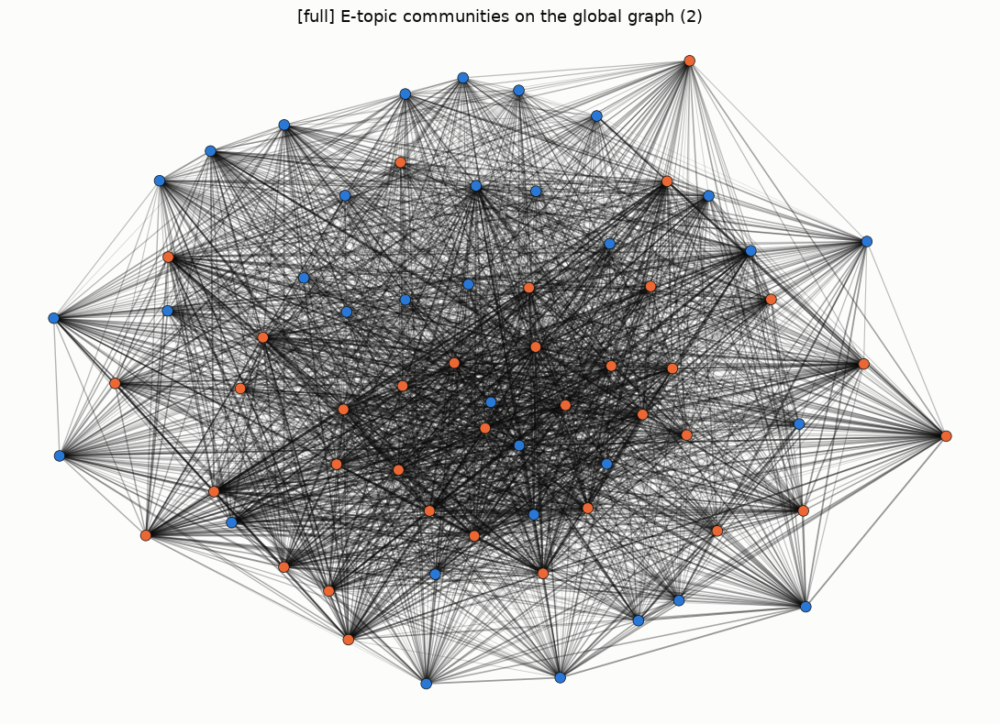

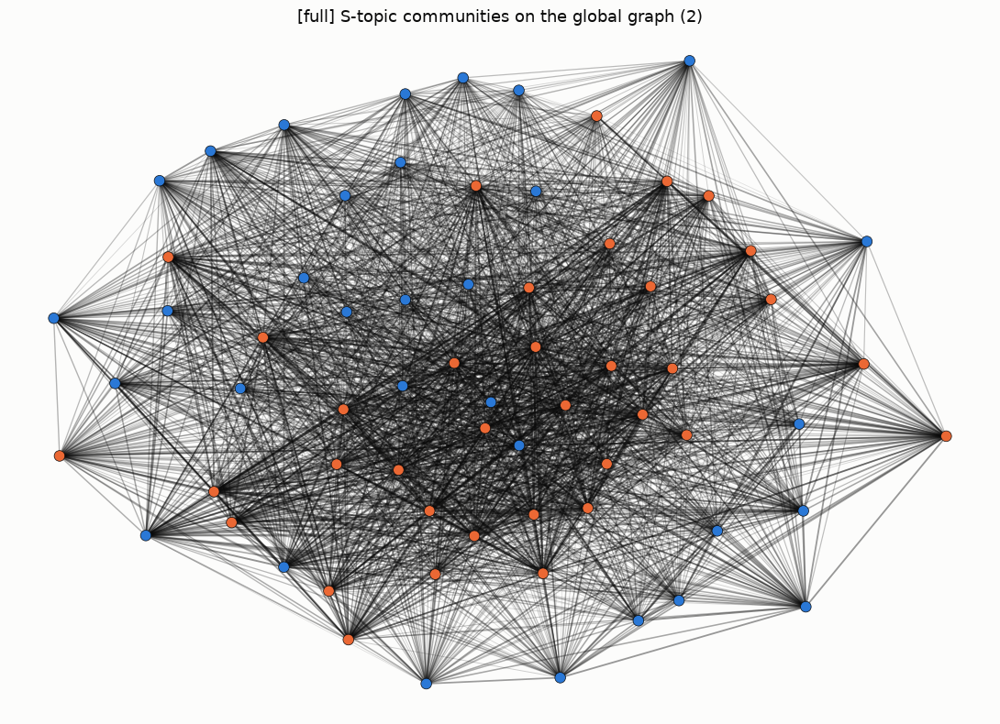

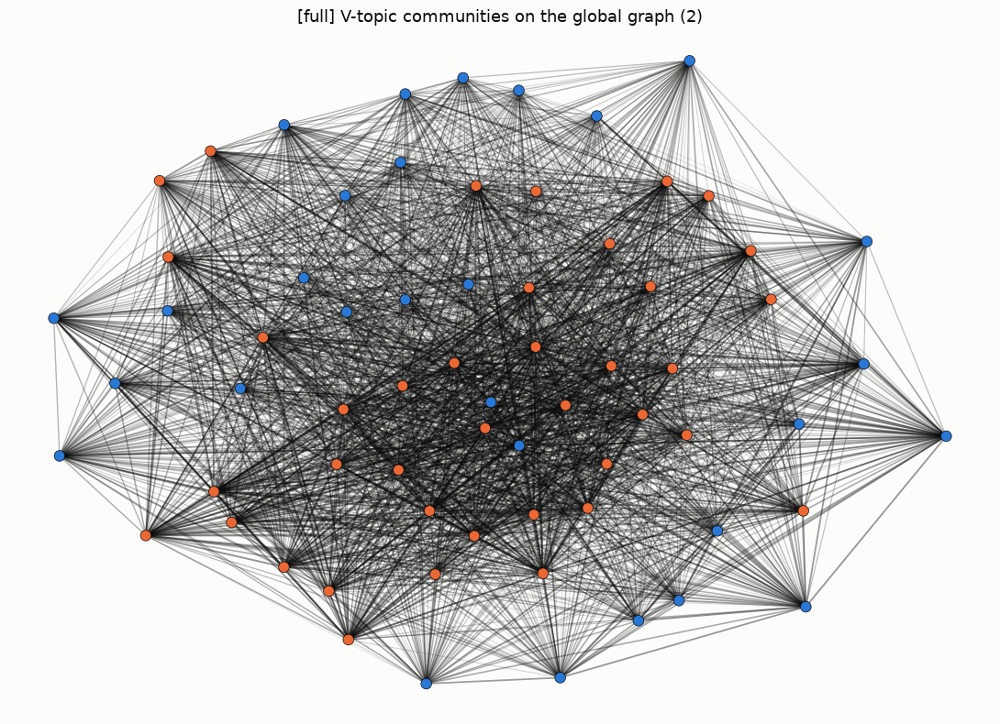

...

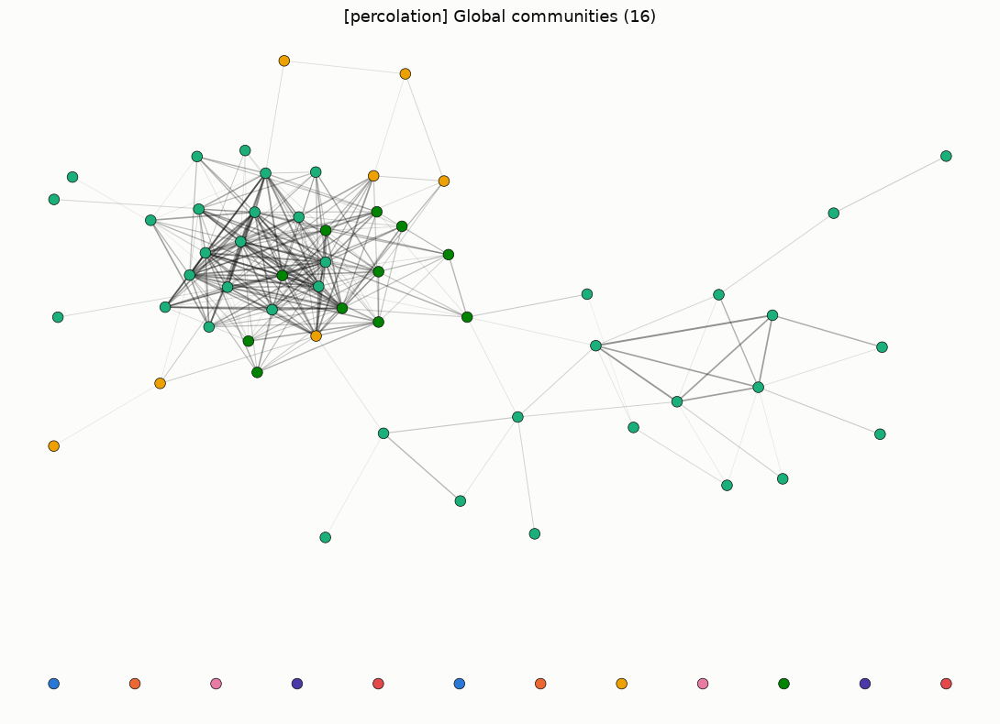

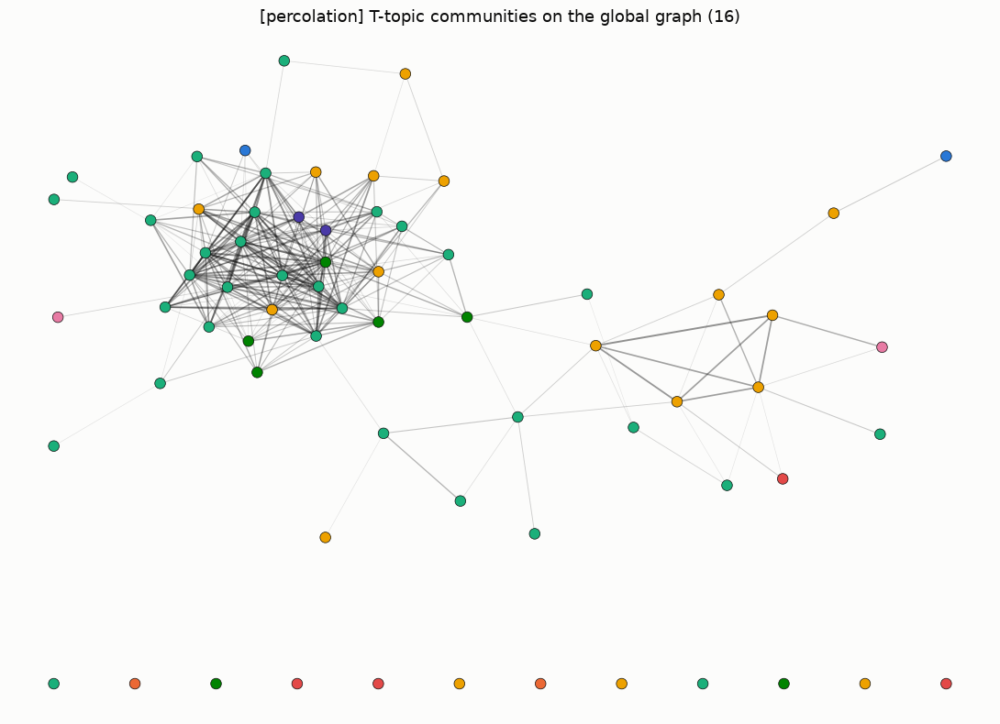

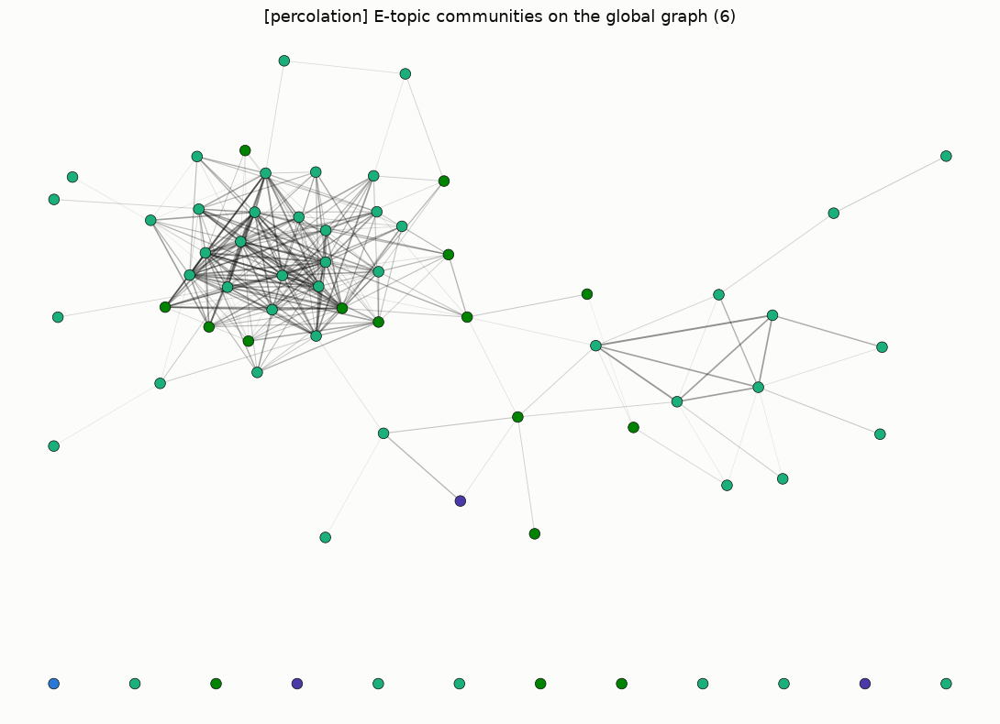

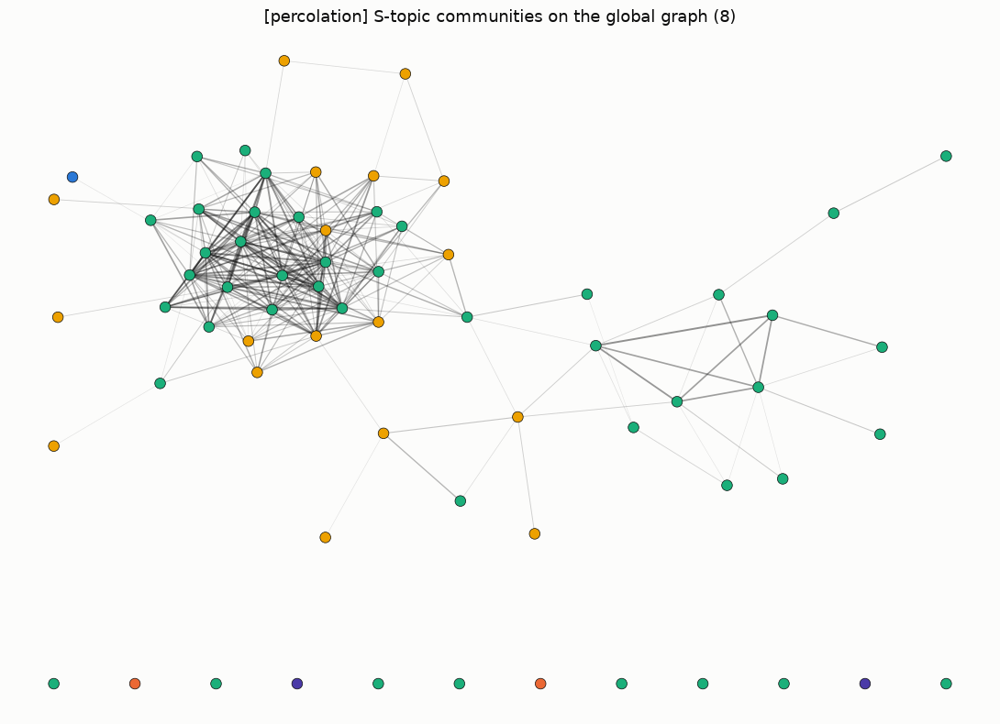

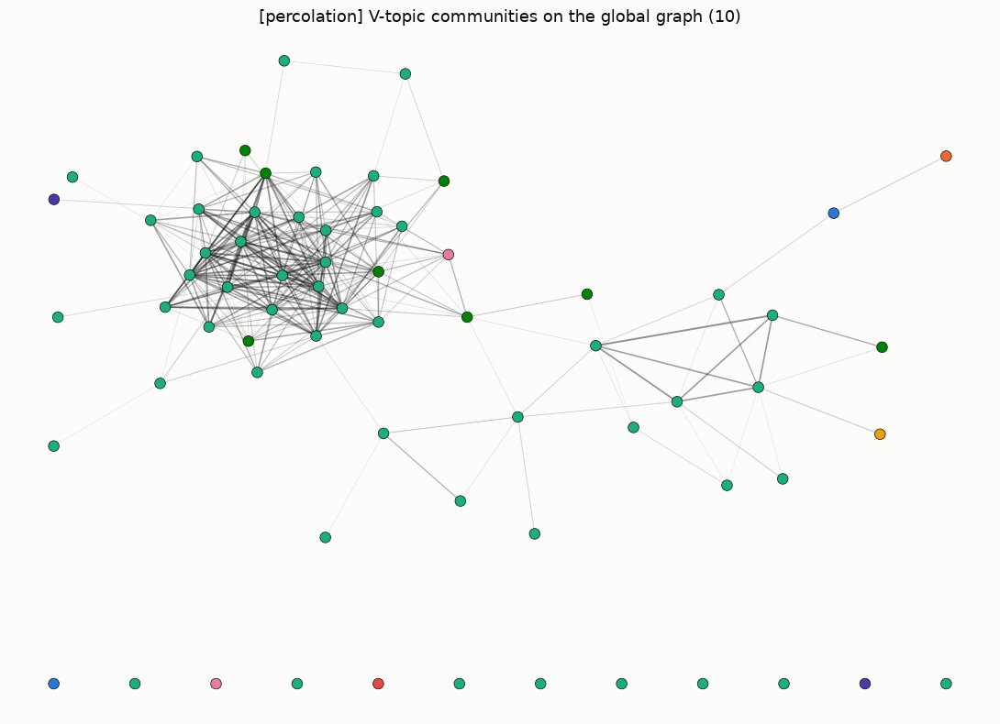

In [51]:
def align_labels(label, reference):
    k = max(label.max(), reference.max()) + 1
    cost = np.zeros((k, k))
    for a in range(k):
        for b in range(k):
            cost[a, b] = -np.sum((label == a) & (reference == b))
    row, col = linear_sum_assignment(cost)
    mapping = dict(zip(row, col))
    return np.array([mapping.get(l, l) for l in label])


def component_layout(G):
    components = sorted(nx.connected_components(G), key=len, reverse=True)
    main_nodes = components[0]
    main = G.subgraph(main_nodes)

    # Kamada-Kawai untangles dense cores far better than spring layout.
    # Seed it with a spring layout, then refine — best of both.
    try:
        init = nx.spring_layout(main, weight=None, seed=42,
                                k=3.0 / np.sqrt(len(main_nodes)), iterations=200)
        main_pos = nx.kamada_kawai_layout(main, pos=init, scale=1.0)
    except Exception:
        main_pos = nx.spring_layout(main, weight=None, seed=42,
                                    k=4.0 / np.sqrt(len(main_nodes)),
                                    iterations=800, scale=1.0)

    pos = dict(main_pos)

    # Isolates / tiny components: pack them into a strip UNDER the main graph,
    # so they don't eat the canvas.
    others = [n for comp in components[1:] for n in comp]
    if others:
        ys = np.array([xy[1] for xy in main_pos.values()])
        xs = np.array([xy[0] for xy in main_pos.values()])
        strip_y0 = ys.min() - 0.35
        per_row = 12
        dx = (xs.max() - xs.min()) / max(per_row - 1, 1)
        for i, n in enumerate(others):
            row, col = divmod(i, per_row)
            pos[n] = np.array([xs.min() + col * dx,
                               strip_y0 - row * 0.18])
    return pos


def draw_big(G, label, title):
    pos = component_layout(G)
    edge_list = list(G.edges())
    ws = np.array([G[u][v]['weight'] for u, v in edge_list])
    ranks = ws.argsort().argsort() / max(len(ws) - 1, 1)
    alphas = 0.10 + 0.35 * ranks
    widths = 0.4 + 1.0 * ranks

    fig, ax = plt.subplots(figsize=(11, 8))
    for (u, v), a, w in zip(edge_list, alphas, widths):
        ax.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]],
                 color=INK, alpha=a, linewidth=w, zorder=1)

    node_colors = [CAT[label[n] % len(CAT)] for n in G.nodes()]
    xs = [pos[n][0] for n in G.nodes()]
    ys = [pos[n][1] for n in G.nodes()]
    ax.scatter(xs, ys, c=node_colors, s=70,
               edgecolors=INK, linewidths=0.5, zorder=2)

    ax.set_title(title, fontsize=13)
    ax.axis('off')
    fig.tight_layout()
    plt.show()


# --- driver: this is what actually produces the plots ---
for gtype in ['full', 'knn', 'threshold', 'percolation']:
    G_global = graphs[('global', 'agreement', gtype)]
    ref_label = partitions[('global', 'agreement', gtype)]
    aligned = {'global': ref_label}
    for t in topics:
        aligned[t] = align_labels(partitions[(t, 'agreement', gtype)], ref_label)
    draw_big(G_global, aligned['global'], f'[{gtype}] Global communities ({len(set(aligned["global"]))})')
    for t in topics:
        draw_big(G_global, aligned[t], f'[{gtype}] {t}-topic communities on the global graph ({len(set(aligned[t]))})')


## 9. Is this a small-world network?

Using the **percolation graphs already built in Section 4**, for all four metrics, compute the metrics a first
course in network science asks for: clustering coefficient, average path
length on the giant component and closeness centrality then compare clustering
against what an Erdős–Rényi random graph with the same $N$ and average degree
would give, the standard small-world diagnostic.


In [52]:

classical_rows = []
for (space, metric), theta in percolation_thetas.items():
    G = graphs[(space, metric, 'percolation')]
    k_mean = 2 * G.number_of_edges() / N
    if k_mean == 0:
        continue
    C = nx.average_clustering(G)
    C_er_expected = k_mean / (N - 1)
    gc_nodes = max(nx.connected_components(G), key=len)
    L_gc = nx.average_shortest_path_length(G.subgraph(gc_nodes))
    closeness = nx.closeness_centrality(G)
    classical_rows.append({
        'space': space, 'metric': metric, 'k_mean': round(k_mean, 2),
        'clustering_C': round(C, 3), 'clustering_C_ER_expected': round(C_er_expected, 3),
        'small_world_ratio': round(C / C_er_expected, 1) if C_er_expected > 0 else np.nan,
        'avg_path_length_gc': round(L_gc, 2), 'mean_closeness': round(np.mean(list(closeness.values())), 3),
    })

classical_df = pd.DataFrame(classical_rows)
classical_df.pivot_table(index='metric', columns='space', values='small_world_ratio')


space,E,S,T,V,global
metric,,,,,
agreement,2.1,2.5,4.2,3.0,3.4
cosine,3.9,2.2,3.5,1.9,2.4
euclidean,3.3,2.7,3.6,3.1,3.6
pearson,3.2,4.6,4.2,5.2,3.2


In [53]:

classical_df.pivot_table(index='metric', columns='space', values='avg_path_length_gc')


space,E,S,T,V,global
metric,,,,,
agreement,1.99,2.20,3.15,2.55,2.89
cosine,2.57,1.70,2.15,1.61,1.68
euclidean,2.41,1.92,2.28,2.39,2.02
pearson,2.18,3.34,2.88,3.59,2.20


**Every metric, on every space, is small-world**: clustering coefficients are
consistently 1.7–5.2x higher than an equivalent Erdős–Rényi random graph,
with short average path lengths on the giant component. This
holds whether the edges are defined by correlation, exact agreement, or raw
distance. The small-world structure is a property of having opinions on a
shared set of questions at all, not an artifact of any one similarity
notion.



## 10. Do the communities disagree or just agree in different levels?

Pearson correlation is heavily used for this section.


In [54]:

neg_rows = []
for space in SPACES:
    A = sim_matrices[(space, 'pearson')]
    iu = np.triu_indices(N, k=1)
    vals = A[iu]
    neg_rows.append({'space': space, 'negative_edges': int((vals < 0).sum()),
                      'total_pairs': len(vals), 'fraction_negative': round((vals < 0).mean(), 3),
                      'most_negative': round(vals.min(), 3)})
pd.DataFrame(neg_rows)


,space,negative_edges,total_pairs,fraction_negative,most_negative
0,global,130,2278,0.057,-0.359
1,T,615,2278,0.270,-0.704
2,E,140,2278,0.061,-0.520
3,S,785,2278,0.345,-0.670
4,V,576,2278,0.253,-0.671


**S and V have more negative edges than T**. Low overall item variance doesn't mean no opposition: a small dissenting minority that consistently disagrees with an otherwise-unanimous majority produces *strong* negative correlations even on a "consensus" topic.


**Structural balance**: a 2-way split is "balanced" if positive edges mostly
fall *within* the two groups and negative edges mostly fall *between* them.


In [55]:

def balance_score(A, labels):
    same = (labels[:, None] == labels[None, :])
    iu = np.triu_indices(len(labels), k=1)
    w, s = A[iu], same[iu]
    good = np.where(s, np.clip(w, 0, None), np.clip(-w, 0, None))
    return good.sum() / np.abs(w).sum()

def local_search_constrained(A, labels, min_size=10, n_iter=300, seed=0):
    rng = np.random.RandomState(seed)
    labels = labels.copy()
    best = balance_score(A, labels)
    improved, it = True, 0
    while improved and it < n_iter:
        improved = False
        it += 1
        for i in rng.permutation(len(labels)):
            old = labels[i]
            labels[i] = 1 - old
            if min(np.sum(labels == 0), np.sum(labels == 1)) < min_size:
                labels[i] = old
                continue
            s = balance_score(A, labels)
            if s > best + 1e-12:
                best, improved = s, True
            else:
                labels[i] = old
    return labels, best

minority_sets = {}
balance_rows = []
for space in SPACES:
    A = sim_matrices[(space, 'pearson')]
    existing = np.array([0 if l == 0 else 1 for l in partitions[(space, 'agreement', 'full')]])
    existing_score = balance_score(A, existing)
    refined, refined_score = local_search_constrained(A, existing, min_size=10)
    sizes = {0: int((refined == 0).sum()), 1: int((refined == 1).sum())}
    minority_label = min(sizes, key=sizes.get)
    minority_sets[space] = set(np.where(refined == minority_label)[0].tolist())
    balance_rows.append({'space': space, 'existing_partition_balance': round(existing_score, 3),
                          'refined_balance': round(refined_score, 3),
                          'majority_size': sizes[1 - minority_label], 'minority_size': sizes[minority_label]})
pd.DataFrame(balance_rows)


,space,existing_partition_balance,refined_balance,majority_size,minority_size
0,global,0.511,0.773,58,10
1,T,0.514,0.835,58,10
2,E,0.526,0.808,58,10
3,S,0.498,0.786,53,15
4,V,0.497,0.787,56,12



**The similarity-based communities score close to 0.5  on
this balance measure, in every space.** They reflect a gradient of "more
similar" vs. "less similar," not real opposition.


In [56]:

print('minority student ids per space:')
for space, idx in minority_sets.items():
    print(f'  {space}: {sorted(cohort.loc[list(idx), "id"].tolist())}')

all_idx = sorted(set.union(*minority_sets.values()))
membership = pd.DataFrame({space: [i in idx for i in all_idx] for space, idx in minority_sets.items()},
                           index=cohort.loc[all_idx, 'id'].values)
membership['n_spaces'] = membership.sum(axis=1)
print('\nstudents who are in the dissenting minority in the most spaces:')
membership.sort_values('n_spaces', ascending=False).head(8)


minority student ids per space:
  global: [13, 46, 52, 70, 89, 90, 109, 111, 117, 119]
  T: [13, 20, 29, 56, 89, 94, 109, 116, 119, 126]
  E: [35, 36, 43, 46, 85, 108, 109, 111, 117, 119]
  S: [16, 21, 22, 52, 62, 63, 72, 80, 90, 101, 108, 109, 111, 119, 126]
  V: [20, 22, 37, 80, 86, 90, 91, 104, 105, 109, 111, 119]

students who are in the dissenting minority in the most spaces:


,global,T,E,S,V,n_spaces
119,True,True,True,True,True,5
109,True,True,True,True,True,5
111,True,False,True,True,True,4
90,True,False,False,True,True,3
126,False,True,False,True,False,2
13,True,True,False,False,False,2
20,False,True,False,False,True,2
22,False,False,False,True,True,2



Two students (**109 and 119**) land in the dissenting minority in **all
five** spaces (global and all four topics): they are the most consistent
contrarians in the entire cohort, not just on one topic.


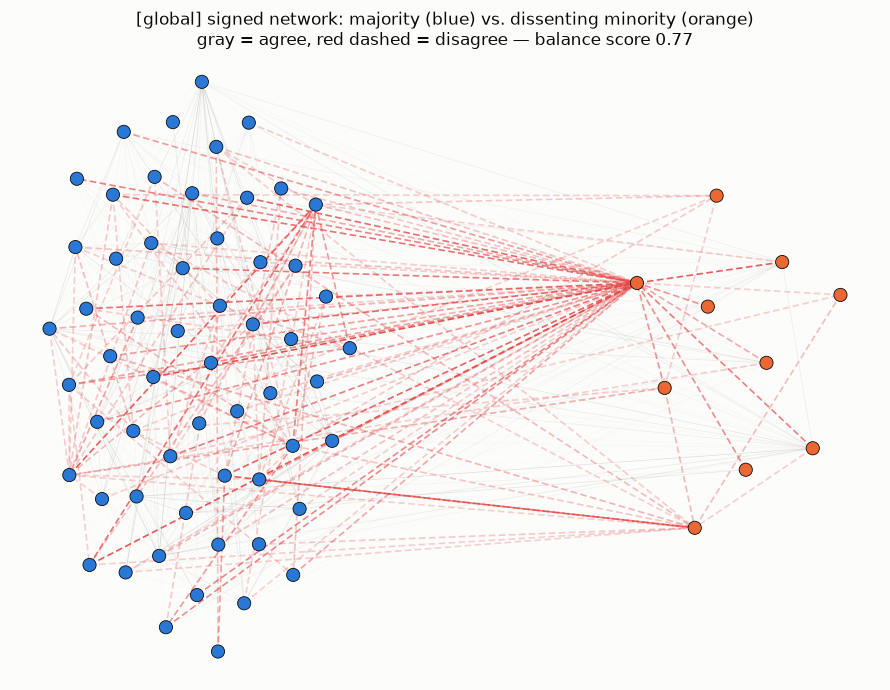

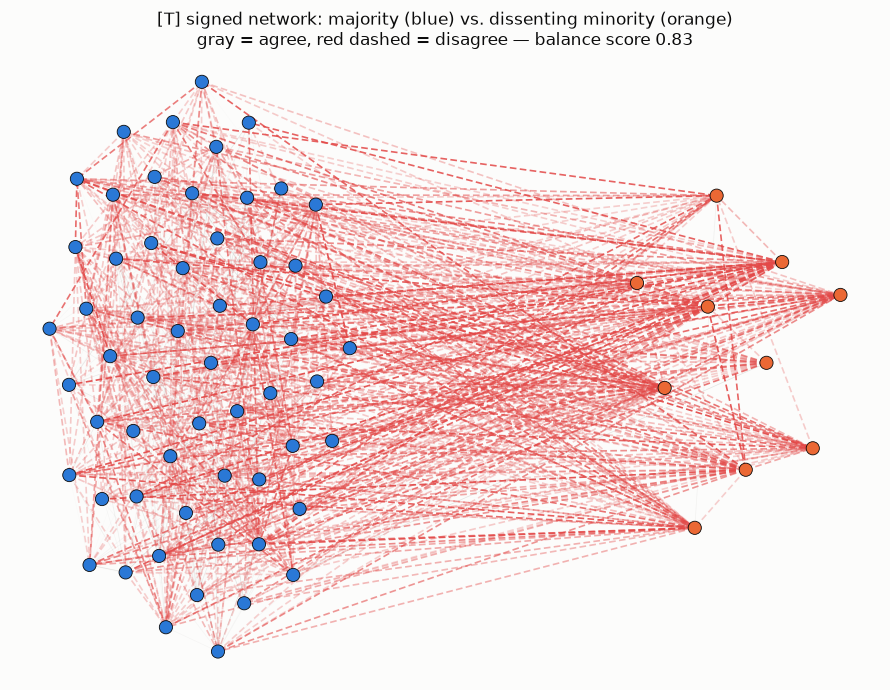

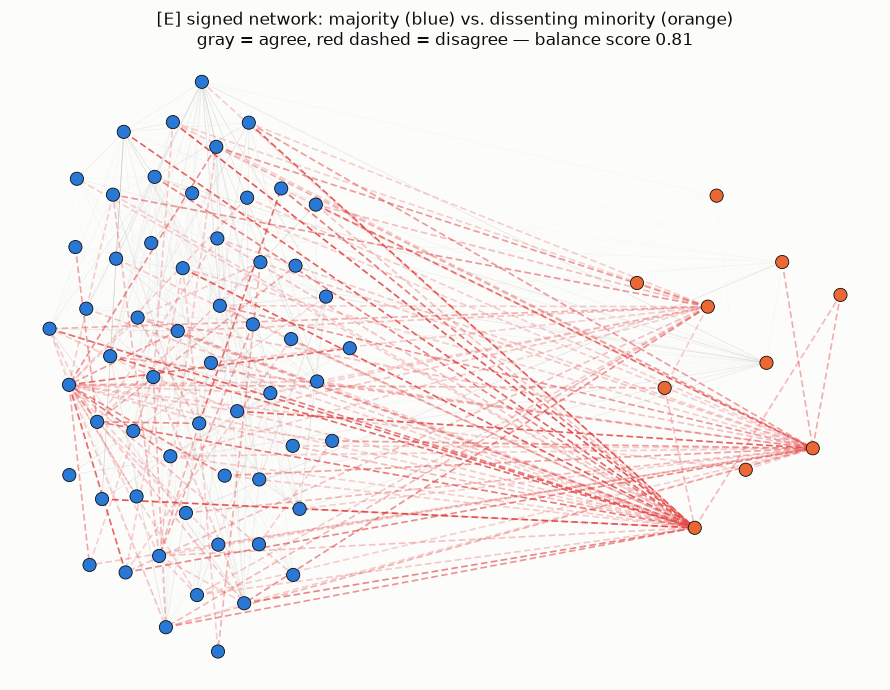

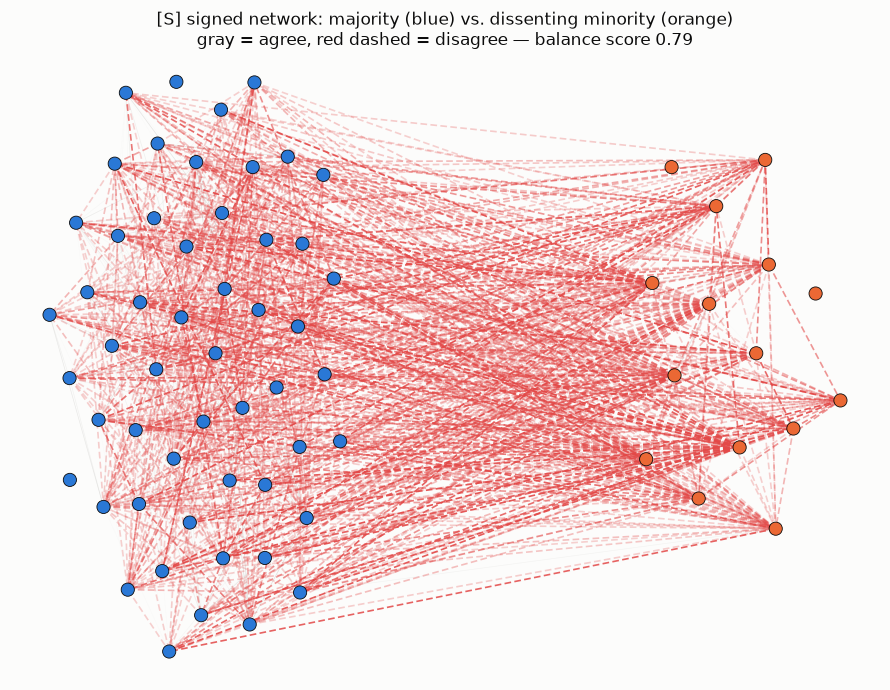

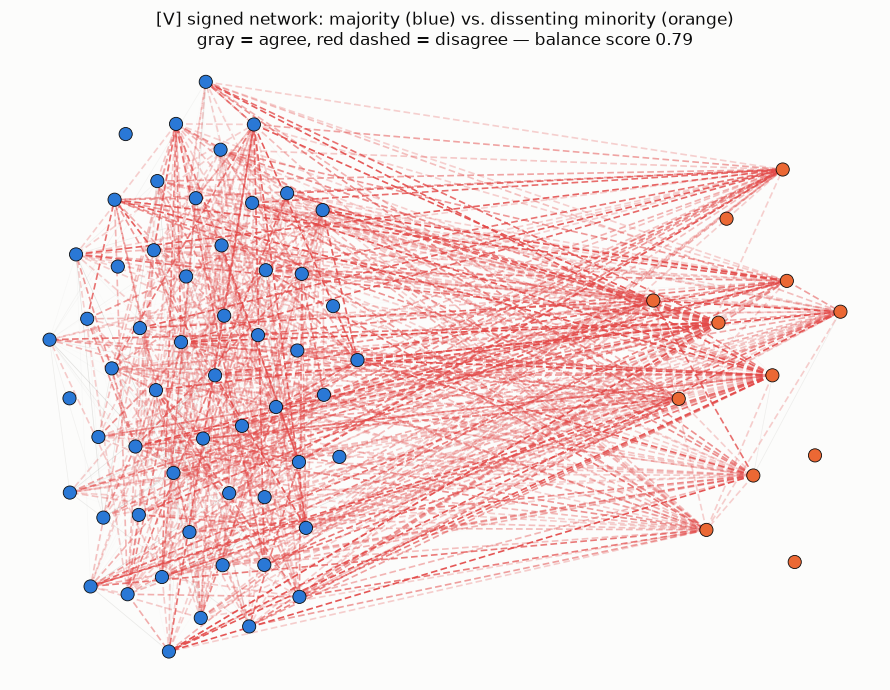

In [73]:
def group_layout(space, minority_label_set, Gabs):
    minority = [n for n in range(N) if n in minority_label_set]
    majority = [n for n in range(N) if n not in minority_label_set]

    def disc_pos(nodes, center, radius):
        """Even sunflower packing — no edge forces, so dense clusters don't collapse."""
        cx, cy = center
        p = {}
        n = len(nodes)
        golden = np.pi * (3 - np.sqrt(5))
        for i, node in enumerate(nodes):
            r = radius * np.sqrt((i + 0.5) / n)
            theta = i * golden
            p[node] = np.array([cx + r * np.cos(theta), cy + r * np.sin(theta)])
        return p

    pos = {}
    pos.update(disc_pos(majority, center=(-1.3, 0.0), radius=0.75))
    pos.update(disc_pos(minority, center=(1.3, 0.0),  radius=0.55))
    return pos


def draw_signed(space, minority_label_set, score):
    A = sim_matrices[(space, 'pearson')]
    Gs = nx.Graph(); Gs.add_nodes_from(range(N))
    Gabs = nx.Graph(); Gabs.add_nodes_from(range(N))
    iu = np.triu_indices(N, k=1)
    for i, j in zip(*iu):
        w = A[i, j]
        if abs(w) > 1e-9:
            Gs.add_edge(int(i), int(j), weight=float(w))
            Gabs.add_edge(int(i), int(j), weight=abs(float(w)))

    pos = group_layout(space, minority_label_set, Gabs)   # <-- group-separated, not spring on whole graph

    edge_list = list(Gs.edges(data='weight'))
    pos_edges = [(u, v, w) for u, v, w in edge_list if w > 0]
    neg_edges = [(u, v, w) for u, v, w in edge_list if w < 0]

    # Only draw the strongest positive edges — the dense weak ones are just noise.
    if pos_edges:
        keep = max(int(len(pos_edges) * 0.15), 30)          # top 15% (or >=30)
        pos_edges = sorted(pos_edges, key=lambda e: e[2], reverse=True)[:keep]

    def scale(ws, floor, ceil, power=4):
        ws = np.abs(np.array(ws))
        ranks = ws.argsort().argsort() / max(len(ws) - 1, 1)
        return floor + (ceil - floor) * (ranks ** power)

    fig, ax = plt.subplots(figsize=(9, 7))
    if pos_edges:
        alphas = scale([w for _, _, w in pos_edges], 0.02, 0.25)
        for (u, v, w), a in zip(pos_edges, alphas):
            ax.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]],
                    color=MUTED, alpha=a, linewidth=0.5, zorder=1)
    if neg_edges:
        alphas = scale([w for _, _, w in neg_edges], 0.25, 0.95)
        for (u, v, w), a in zip(neg_edges, alphas):
            ax.plot([pos[u][0], pos[v][0]], [pos[u][1], pos[v][1]],
                    color=CAT[7], alpha=a, linewidth=1.2,
                    linestyle=(0, (4, 2)), zorder=2)

    node_colors = [CAT[1] if n in minority_label_set else CAT[0] for n in Gs.nodes()]
    xs = [pos[n][0] for n in Gs.nodes()]; ys = [pos[n][1] for n in Gs.nodes()]
    ax.scatter(xs, ys, c=node_colors, s=90, edgecolors=INK, linewidths=0.6, zorder=3)

    ax.set_title(f'[{space}] signed network: majority (blue) vs. dissenting minority (orange)\n'
                 f'gray = agree, red dashed = disagree — balance score {score:.2f}', fontsize=12)
    ax.axis('off')
    fig.tight_layout()
    plt.show()


# --- driver: this is what produces the plots ---
for row, space in zip(balance_rows, SPACES):
    draw_signed(space, minority_sets[space], row['refined_balance'])


## 11. Are the same students always "typical" or always "contrarian"?

A different, individual-level version of the same
underlying question. For each student in each of the five spaces, compute
**typicality** as their average agreement-rate similarity to everyone else in
that space.


In [58]:

centrality = pd.DataFrame(index=cohort['id'])
for space in SPACES:
    S = sim_matrices[(space, 'agreement')].copy()
    np.fill_diagonal(S, np.nan)
    centrality[space] = np.nanmean(S, axis=1)

from scipy.stats import spearmanr
spaces_list = list(SPACES.keys())
corr = np.array([[spearmanr(centrality[a], centrality[b]).correlation for b in spaces_list] for a in spaces_list])
corr_df = pd.DataFrame(corr, index=spaces_list, columns=spaces_list)
corr_df.round(2)


,global,T,E,S,V
global,1.00,0.54,0.74,0.86,0.78
T,0.54,1.00,0.23,0.34,0.28
E,0.74,0.23,1.00,0.56,0.32
S,0.86,0.34,0.56,1.00,0.63
V,0.78,0.28,0.32,0.63,1.00


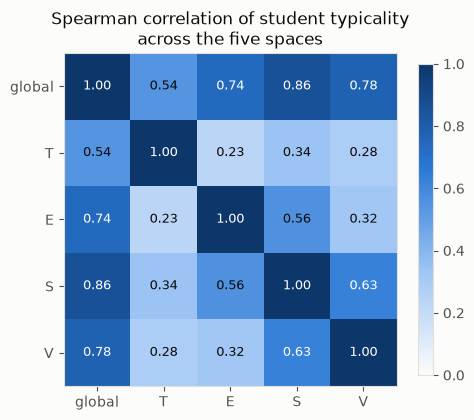

In [59]:

fig, ax = plt.subplots(figsize=(5, 4.5))
seq_cmap = mcolors.LinearSegmentedColormap.from_list('seq', ['#fcfcfb', '#9ec5f4', '#2a78d6', '#0d366b'])
im = ax.imshow(corr_df.values, cmap=seq_cmap, vmin=0, vmax=1)
ax.set_xticks(range(5)); ax.set_xticklabels(spaces_list)
ax.set_yticks(range(5)); ax.set_yticklabels(spaces_list)
for i in range(5):
    for j in range(5):
        ax.text(j, i, f'{corr_df.values[i,j]:.2f}', ha='center', va='center',
                color='white' if corr_df.values[i, j] > 0.6 else INK, fontsize=9)
ax.set_title('Spearman correlation of student typicality\nacross the five spaces')
fig.colorbar(im, ax=ax, shrink=0.8)
fig.tight_layout()
plt.show()


In [60]:

ranks = centrality.rank(ascending=False)
avg_rank = ranks.mean(axis=1).sort_values()
print('most consistently TYPICAL students (low average rank across all 5 spaces):')
display(centrality.loc[avg_rank.head(5).index].assign(avg_rank=avg_rank.head(5)))
print('\nmost consistently ATYPICAL / contrarian students (high average rank):')
display(centrality.loc[avg_rank.tail(5).index].assign(avg_rank=avg_rank.tail(5)))


most consistently TYPICAL students (low average rank across all 5 spaces):


,global,T,E,S,V,avg_rank
id,,,,,,
110,0.464428,0.395025,0.441791,0.502488,0.518408,7.2
105,0.465423,0.412935,0.461692,0.488557,0.498507,7.8
67,0.459950,0.394030,0.437811,0.499502,0.508458,9.8
114,0.458955,0.384080,0.469652,0.471642,0.510448,10.0
104,0.457214,0.382090,0.458706,0.489552,0.498507,11.3



most consistently ATYPICAL / contrarian students (high average rank):


,global,T,E,S,V,avg_rank
id,,,,,,
58,0.292040,0.381095,0.253731,0.261692,0.271642,56.9
65,0.330597,0.330348,0.333333,0.295522,0.363184,57.8
117,0.323383,0.308458,0.307463,0.288557,0.389055,59.2
22,0.297015,0.250746,0.340299,0.274627,0.322388,63.0
119,0.206468,0.339303,0.148259,0.169154,0.169154,63.8



Student **119** is the single most atypical student by this measure (lowest
typicality in global, E, S, *and* V). This is the same student who landed in the
dissenting minority in **all five** signed-network splits in Section 10. Two
independent methods agree on who the most consistent contrarian is.


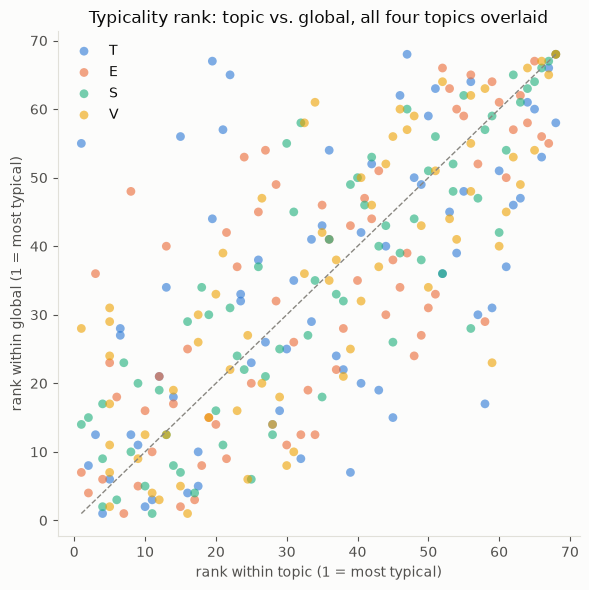

In [61]:

fig, ax = plt.subplots(figsize=(6, 6))
for i, t in enumerate(topics):
    ax.scatter(ranks[t], ranks['global'], color=TOPIC_COLOR[t], alpha=0.6, s=40, label=t, edgecolors='none')
ax.plot([1, N], [1, N], color=MUTED, linewidth=1, linestyle='--')
ax.set_xlabel('rank within topic (1 = most typical)')
ax.set_ylabel('rank within global (1 = most typical)')
ax.legend(frameon=False)
ax.set_title('Typicality rank: topic vs. global, all four topics overlaid')
ax.spines[['top', 'right']].set_visible(False)
fig.tight_layout()
plt.show()



S (green) and V (yellow) points hug the diagonal more closely than T (blue),
which scatters widely above and below it. Typicality is high among S and V compared to other topics.



## 12. Summary

1. **All four similarity metrics broadly agree**: S (society/ethics) and V
   (environment) topic communities match the global community far more than
   T (AI/tech) and E (education) do. Agreement-rate and the newly-fused
   Euclidean distance show this most cleanly.
2. **The finding survives all four graph-building strategies** i.e (full,
   k-NN, density-matched threshold, and the percolation-theoretic threshold) 
   though the *strength* of the effect is largest on the unsparsified full graph.
3. That gap tracks a **consensus/ceiling effect**: V and S have
   much lower item variance than T and E, so there's less topic-specific
   signal to diverge from a general disposition in the first place.
4. **This is a small-world network under every metric**:
   clustering coefficients 2–4x higher than an equivalent random graph, with
   short average path lengths which is a property of the opinions, not an
   artifact of any one similarity notion.
5. **The similarity-based communities are not opposing**: Real
   polarization exists, but as a small (10–15 student) dissenting minority,
   not a roughly-even split.
6. **Students 109 and 119 are the cohort's most consistent contrarians**:
   identified independently by the signed-network minority analysis and the plain typicality/centrality measure.



---

## Questions as nodes

**"Which survey items rise and fall together across the whole cohort?"** is the main question of the section.
Nodes are the 60 survey questions and an edge means two questions are answered in a statistically associated way
across all 96 respondents.



## 13. Building the graph

Students are not dropped for having no recorded responses as the graphs
needed the *same* students present in every one of five graphs to compare
communities across them fairly, so it restricted to complete cases. Here,
each edge is an independent correlation between two *questions*, computed
over whichever respondents answered both (a **pairwise-complete** strategy).


In [62]:

question_df = data[GLOBAL_COLS].astype(float)
print(f'respondents: {question_df.shape[0]}, questions: {question_df.shape[1]}')
print(f'missing: {question_df.isna().sum().sum()} / {question_df.size} '
      f'({100*question_df.isna().sum().sum()/question_df.size:.2f}%)')

corr = question_df.corr(method='spearman')

def pairwise_n(df):
    mask = df.notna().astype(int)
    return mask.T.dot(mask)
n_obs = pairwise_n(question_df)

iu = np.triu_indices_from(corr.values, k=1)
offdiag = corr.values[iu]
print(f'\n{len(offdiag)} unique question pairs')
for thresh in [0.30, 0.35, 0.40, 0.45, 0.50]:
    n_pos = (offdiag >= thresh).sum()
    n_neg = (offdiag <= -thresh).sum()
    print(f'|rho| >= {thresh}: {n_pos} positive, {n_neg} negative, {n_pos + n_neg} total edges')


respondents: 96, questions: 60
missing: 542 / 5760 (9.41%)

1770 unique question pairs
|rho| >= 0.3: 322 positive, 6 negative, 328 total edges
|rho| >= 0.35: 188 positive, 1 negative, 189 total edges
|rho| >= 0.4: 91 positive, 1 negative, 92 total edges
|rho| >= 0.45: 43 positive, 0 negative, 43 total edges
|rho| >= 0.5: 13 positive, 0 negative, 13 total edges


In [63]:

domain_of = {c: c[0] for c in GLOBAL_COLS}
THRESHOLD = 0.40

Gq = nx.Graph()
for code_ in GLOBAL_COLS:
    col = question_df[code_]
    Gq.add_node(code_, domain=domain_of[code_], mean=round(col.mean(), 3), variance=round(col.var(), 3))

q_codes = list(GLOBAL_COLS)
for i in range(len(q_codes)):
    for j in range(i + 1, len(q_codes)):
        a, b = q_codes[i], q_codes[j]
        rho = corr.loc[a, b]
        if abs(rho) >= THRESHOLD:
            Gq.add_edge(a, b, weight=round(float(rho), 3), abs_weight=round(abs(float(rho)), 3),
                        sign='positive' if rho > 0 else 'negative', n_pairs=int(n_obs.loc[a, b]))

print(f'Graph: {Gq.number_of_nodes()} nodes, {Gq.number_of_edges()} edges, density {nx.density(Gq):.4f}')
q_isolates = list(nx.isolates(Gq))
print(f'Isolated nodes: {len(q_isolates)}')
print(pd.Series([domain_of[c] for c in q_isolates]).value_counts())

print('\nnegative edge(s):')
for u, v, d in Gq.edges(data=True):
    if d['sign'] == 'negative':
        print(f'  {u} <-> {v}: rho={d["weight"]}, n={d["n_pairs"]}')


Graph: 60 nodes, 92 edges, density 0.0520
Isolated nodes: 17
T    10
E     6
S     1
Name: count, dtype: int64

negative edge(s):
  E03 <-> E10: rho=-0.405, n=87


17 of 60 items are isolated at this threshold, and **10 of those 17 are
Technology items**. Two-thirds of the T domain has no strongly-correlated
partner anywhere in the survey. 


## 14. Threshold sensitivity and the 0.40 choice


In [64]:

sens_rows = []
for thresh in [0.30, 0.35, 0.40, 0.45, 0.50]:
    Gt = nx.Graph(); Gt.add_nodes_from(q_codes)
    for i in range(len(q_codes)):
        for j in range(i + 1, len(q_codes)):
            rho = corr.iloc[i, j]
            if abs(rho) >= thresh:
                Gt.add_edge(q_codes[i], q_codes[j], weight=abs(rho))
    comms_t = nx.community.louvain_communities(Gt, weight='weight', seed=42) if Gt.number_of_edges() > 0 else []
    mod = nx.community.modularity(Gt, comms_t, weight='weight') if comms_t else np.nan
    n_substantive = sum(1 for c in comms_t if len(c) >= 2)
    sens_rows.append({'threshold': thresh, 'edges': Gt.number_of_edges(), 'isolates': len(list(nx.isolates(Gt))),
                       'n_communities': len(comms_t), 'substantive_communities': n_substantive,
                       'modularity': round(mod, 4) if mod == mod else None})
sens_df = pd.DataFrame(sens_rows)
sens_df


,threshold,edges,isolates,n_communities,substantive_communities,modularity
0,0.30,328,3,7,4,0.2522
1,0.35,189,12,18,6,0.3159
2,0.40,92,17,23,6,0.3886
3,0.45,43,26,35,9,0.5154
4,0.50,13,42,49,7,0.7008


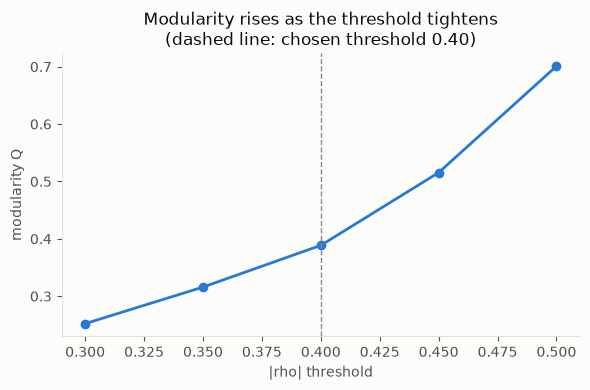

In [65]:

fig, ax = plt.subplots(figsize=(6, 4))
ax.plot(sens_df['threshold'], sens_df['modularity'], color=CAT[0], marker='o', linewidth=2)
ax.axvline(0.40, color=MUTED, linestyle='--', linewidth=1)
ax.set_xlabel('|rho| threshold')
ax.set_ylabel('modularity Q')
ax.set_title('Modularity rises as the threshold tightens\n(dashed line: chosen threshold 0.40)')
ax.spines[['top', 'right']].set_visible(False)
fig.tight_layout()
plt.show()



## 15. Community detection

Louvain on |ρ| (not signed ρ, since Louvain needs non-negative weights); the
single negative edge is kept as a separate attribute for interpretation
rather than folded into the community-detection weight.


In [66]:

q_comms = nx.community.louvain_communities(Gq, weight='abs_weight', seed=42)
q_partition = {n: cid for cid, nodes in enumerate(q_comms) for n in nodes}
nx.set_node_attributes(Gq, q_partition, 'community')
q_modularity = nx.community.modularity(Gq, q_comms, weight='abs_weight')
print(f'Communities: {len(q_comms)}, Modularity: {q_modularity:.4f}')

substantive = [c for c in q_comms if len(c) >= 2]
print(f'Substantive communities (n>=2): {len(substantive)}\n')
for c in sorted(substantive, key=len, reverse=True):
    print(f'  (n={len(c)}): {sorted(c)}')


Communities: 23, Modularity: 0.3886
Substantive communities (n>=2): 6

  (n=13): ['S01', 'S02', 'S03', 'S04', 'S07', 'S09', 'S13', 'S14', 'S15', 'T11', 'V03', 'V10', 'V12']
  (n=10): ['E03', 'E07', 'E10', 'E12', 'E14', 'E15', 'S06', 'T02', 'V01', 'V02']
  (n=9): ['E11', 'S10', 'S11', 'S12', 'V05', 'V06', 'V07', 'V09', 'V15']
  (n=5): ['V04', 'V08', 'V11', 'V13', 'V14']
  (n=4): ['S05', 'T10', 'T12', 'T13']
  (n=2): ['E05', 'E06']


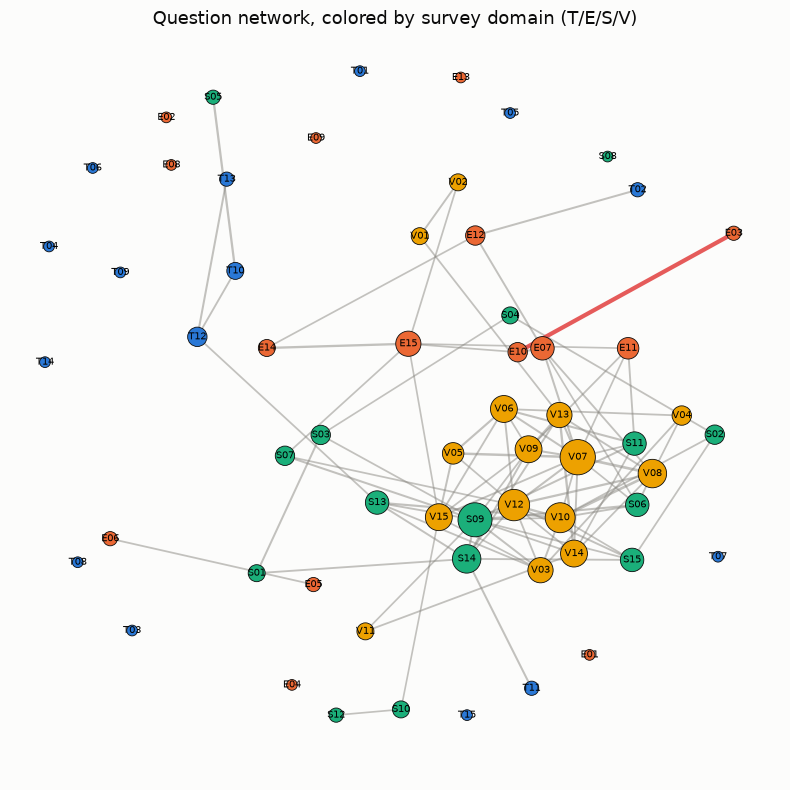

In [67]:

pos_q = nx.spring_layout(Gq, k=0.5, seed=42, weight='abs_weight')

def draw_q_edges(ax, G, pos):
    pos_edges = [(u, v) for u, v, d in G.edges(data=True) if d['sign'] == 'positive']
    neg_edges = [(u, v) for u, v, d in G.edges(data=True) if d['sign'] == 'negative']
    nx.draw_networkx_edges(G, pos, edgelist=pos_edges, width=[G[u][v]['abs_weight'] * 3 for u, v in pos_edges],
                            edge_color=MUTED, alpha=0.5, ax=ax)
    nx.draw_networkx_edges(G, pos, edgelist=neg_edges, width=[G[u][v]['abs_weight'] * 7.5 for u, v in neg_edges],
                            edge_color=CAT[7], alpha=0.9, ax=ax)

def q_node_sizes(G, base=60, scale=45):
    return [base + scale * G.degree(n) for n in G.nodes()]

fig, ax = plt.subplots(figsize=(8, 8))
draw_q_edges(ax, Gq, pos_q)
nx.draw_networkx_nodes(Gq, pos_q, node_color=[TOPIC_COLOR[Gq.nodes[n]['domain']] for n in Gq.nodes()],
                        node_size=q_node_sizes(Gq), edgecolors=INK, linewidths=0.6, ax=ax)
nx.draw_networkx_labels(Gq, pos_q, font_size=7, ax=ax)
ax.set_title('Question network, colored by survey domain (T/E/S/V)', fontsize=13)
ax.axis('off')
fig.tight_layout()
plt.show()


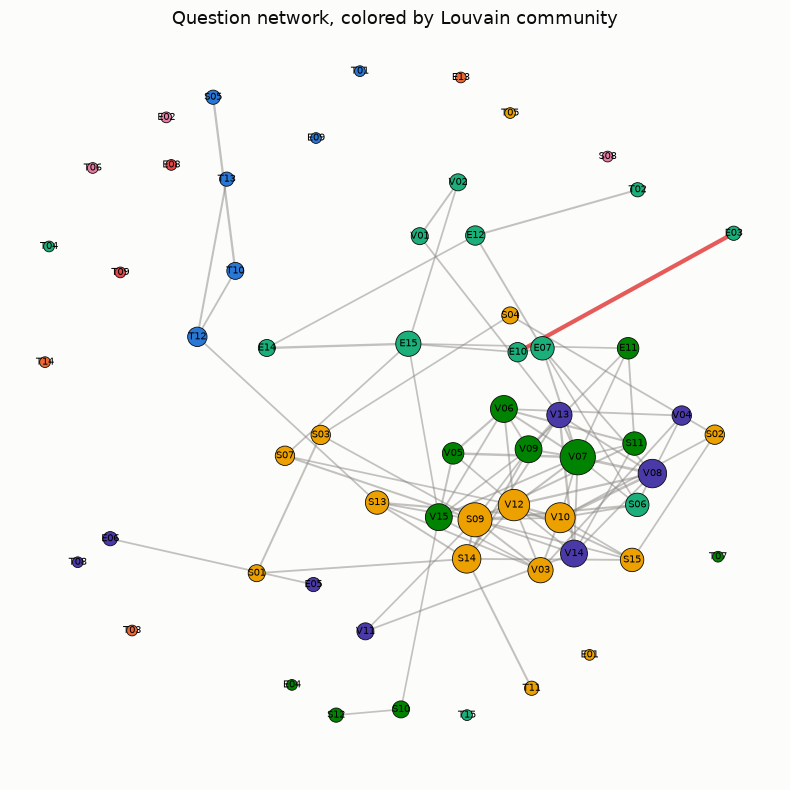

In [68]:

fig, ax = plt.subplots(figsize=(8, 8))
draw_q_edges(ax, Gq, pos_q)
comm_colors = [CAT[q_partition[n] % len(CAT)] for n in Gq.nodes()]
nx.draw_networkx_nodes(Gq, pos_q, node_color=comm_colors, node_size=q_node_sizes(Gq), edgecolors=INK,
                        linewidths=0.6, ax=ax)
nx.draw_networkx_labels(Gq, pos_q, font_size=7, ax=ax)
ax.set_title('Question network, colored by Louvain community', fontsize=13)
ax.axis('off')
fig.tight_layout()
plt.show()



## 16. Centrality: hubs and bridges

- **Degree** finds thematic hubs as the most-agreed-upon-alongside-others items.
- **Betweenness** finds bridges: items that connect otherwise-separate clusters, which can be a completely different set of nodes than the hubs.
- **Cross-domain neighbor fraction** distinguishes a genuine cross-domain bridge from a high-degree hub that's simply well-connected within its own domain.


In [69]:

for u, v, d in Gq.edges(data=True):
    d['distance'] = 1.0 / d['abs_weight']

deg_c = nx.degree_centrality(Gq)
btw_c = nx.betweenness_centrality(Gq, weight='distance', normalized=True)

cent_rows = []
for n in Gq.nodes():
    nbrs = list(Gq.neighbors(n))
    domain = Gq.nodes[n]['domain']
    cross = [m for m in nbrs if Gq.nodes[m]['domain'] != domain]
    cent_rows.append({'code': n, 'domain': domain, 'degree': Gq.degree(n),
                       'degree_centrality': round(deg_c[n], 4), 'betweenness': round(btw_c[n], 4),
                       'pct_cross_domain': round(len(cross) / len(nbrs), 3) if nbrs else None})
centrality_df = pd.DataFrame(cent_rows)

print('=== top 8 hubs by degree ===')
display(centrality_df.sort_values('degree', ascending=False).head(8))
print('\n=== top 8 bridges by betweenness ===')
display(centrality_df.sort_values('betweenness', ascending=False).head(8))

r = nx.attribute_assortativity_coefficient(Gq, 'domain')
same = sum(1 for u, v in Gq.edges() if Gq.nodes[u]['domain'] == Gq.nodes[v]['domain'])
cross_e = Gq.number_of_edges() - same
print(f'\ndomain assortativity r = {r:.4f} '
      f'(same-domain edges: {same} [{100*same/Gq.number_of_edges():.1f}%], '
      f'cross-domain: {cross_e} [{100*cross_e/Gq.number_of_edges():.1f}%])')


=== top 8 hubs by degree ===


,code,domain,degree,degree_centrality,betweenness,pct_cross_domain
51,V07,V,13,0.2203,0.0830,0.308
38,S09,S,12,0.2034,0.0842,0.417
56,V12,V,10,0.1695,0.0251,0.300
54,V10,V,9,0.1525,0.0725,0.556
43,S14,S,8,0.1356,0.0608,0.500
52,V08,V,8,0.1356,0.0444,0.250
53,V09,V,7,0.1186,0.0158,0.429
50,V06,V,7,0.1186,0.0094,0.143



=== top 8 bridges by betweenness ===


,code,domain,degree,degree_centrality,betweenness,pct_cross_domain
42,S13,S,5,0.0847,0.0859,0.600
38,S09,S,12,0.2034,0.0842,0.417
51,V07,V,13,0.2203,0.0830,0.308
54,V10,V,9,0.1525,0.0725,0.556
21,E07,E,5,0.0847,0.0713,0.600
11,T12,T,3,0.0508,0.0660,0.333
43,S14,S,8,0.1356,0.0608,0.500
59,V15,V,7,0.1186,0.0544,0.286



domain assortativity r = 0.4103 (same-domain edges: 58 [63.0%], cross-domain: 34 [37.0%])



## 17. Consensus vs. controversy

Rank questions by response variance, and check whether variance predicts network position.


In [70]:

attr_rows = []
for n, d in Gq.nodes(data=True):
    attr_rows.append({'code': n, 'domain': d['domain'], 'mean': d['mean'], 'variance': d['variance'],
                       'degree': Gq.degree(n)})
attr_df = pd.DataFrame(attr_rows)

print('=== most consensual (lowest variance) ===')
display(attr_df.sort_values('variance').head(6))
print('\n=== most controversial (highest variance) ===')
display(attr_df.sort_values('variance', ascending=False).head(6))

corr_var_deg = attr_df['variance'].corr(attr_df['degree'], method='spearman')
print(f"\nSpearman corr(variance, degree) = {corr_var_deg:.3f} "
      f"(negative -> consensual questions tend to become hubs)")

print('\n=== all negative correlations with |rho| >= 0.30 ===')
neg_pairs = []
for i in range(len(q_codes)):
    for j in range(i + 1, len(q_codes)):
        rho = corr.iloc[i, j]
        if rho <= -0.30:
            neg_pairs.append({'q1': q_codes[i], 'q2': q_codes[j], 'rho': round(float(rho), 3)})
display(pd.DataFrame(neg_pairs).sort_values('rho'))


=== most consensual (lowest variance) ===


,code,domain,mean,variance,degree
29,E15,E,4.713,0.254,6
57,V13,V,4.671,0.319,6
38,S09,S,4.471,0.347,12
50,V06,V,4.512,0.349,7
34,S05,S,4.632,0.352,1
40,S11,S,4.552,0.366,5



=== most controversial (highest variance) ===


,code,domain,mean,variance,degree
18,E04,E,3.437,1.365,0
17,E03,E,2.057,1.264,1
16,E02,E,2.839,1.253,0
7,T08,T,3.078,1.196,0
31,S02,S,3.839,1.113,3
23,E09,E,3.791,1.085,0



Spearman corr(variance, degree) = -0.559 (negative -> consensual questions tend to become hubs)

=== all negative correlations with |rho| >= 0.30 ===


,q1,q2,rho
3,E03,E10,-0.405
4,E03,E11,-0.346
0,T03,E04,-0.333
2,E01,E02,-0.328
1,T14,E03,-0.313
5,E03,E12,-0.305


**E03** ("Class attendance should be compulsory for all courses") is the
network's one clearly divisive item: at the primary threshold it has degree
1 (only the negative edge to E10), but at |ρ|≥0.30 it's involved in **four of the only six negative correlations found anywhere in this dataset**,
consistently opposing innovation/technology-oriented items (E10, E11, E12,
T14).

In [71]:

Gq.graph['n_obs_table'] = n_obs  # keep for reference
nx.write_gexf(Gq, 'question_network.gexf')
centrality_df.to_csv('centrality_metrics.csv', index=False)
attr_df.to_csv('consensus_controversy.csv', index=False)
corr.to_csv('spearman_corr.csv')
sens_df.to_csv('threshold_sensitivity.csv', index=False)
print('saved: question_network.gexf, centrality_metrics.csv, consensus_controversy.csv, spearman_corr.csv, threshold_sensitivity.csv')


saved: question_network.gexf, centrality_metrics.csv, consensus_controversy.csv, spearman_corr.csv, threshold_sensitivity.csv



## 18. Summary

1. **Environment forms the most internally coherent block** in the
   question-network too — the largest, most cohesive Louvain communities are
   dominated by V items and they include the network's highest-degree
   hub.
2. **Technology is the most fragmented domain**: 10 of 17 isolated items (at
   |ρ|≥0.40) are Technology items which means the students' T opinions don't correlate
   strongly with each other the way S/V opinions do.
3. **Consensus and network centrality are structurally linked**: items the class agrees on become hubs;
   divisive items become isolates.
4. **E03 (compulsory attendance) is a singular ideological fault line**,
   consistently opposed to innovation- and technology-oriented education
   items and becomes the dataset's only clear case of actual disagreement rather than
   mere lack of correlation.
